In [23]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from collections import Counter
import seaborn as sns
from requests import get
from requests.exceptions import RequestException
from contextlib import closing
from bs4 import BeautifulSoup
import urllib.request, json 
import pygraphviz as pgv
from IPython.display import Image
import networkx as nx
from operator import itemgetter
import community

%matplotlib inline

---
# Top Tracks

In [24]:
with urllib.request.urlopen("secret_url :)") as url:
    top_tracks = json.loads(url.read().decode())

In [25]:
print('number of data points collected:',len(top_tracks))

number of data points collected: 113


In [27]:
for j in range(len(top_tracks)):
    for i in range(len(top_tracks[j]['tracks'])):
        top_tracks[j]['tracks'][i]['rank'] = i+1

In [28]:
total_top_tracks = pd.DataFrame()

for i in range(len(top_tracks)):
    df = pd.DataFrame(top_tracks[i]['tracks'])
    df['display_name'] = top_tracks[i]['display_name']
    total_top_tracks = total_top_tracks.append(df,ignore_index=True)

/usr/local/lib/python3.6/site-packages/pandas/core/frame.py:6211: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort)


In [96]:
anon_dict = {}

for i,j in enumerate(total_top_tracks.display_name.unique()):
    anon_dict[j] = i

In [36]:
total_top_tracks['anon_display_name'] = total_top_tracks['display_name'].apply(lambda x: anon_dict[x])

In [40]:
total_top_tracks.drop('display_name',axis=1,inplace=True)

---
# Top Artists & Genres

In [42]:
with urllib.request.urlopen("secret url :)") as url:
    top_artists = json.loads(url.read().decode())

In [43]:
print('number of data points collected:',len(top_artists))

number of data points collected: 113


In [44]:
for j in range(len(top_artists)):
    for i in range(len(top_artists[j]['artists'])):
        top_artists[j]['artists'][i]['rank'] = i+1

In [46]:
total_top_artists = pd.DataFrame()

for i in range(len(top_artists)):
    df = pd.DataFrame(top_artists[i]['artists'])
    df['display_name'] = top_artists[i]['display_name']
    total_top_artists = total_top_artists.append(df,ignore_index=True)

/usr/local/lib/python3.6/site-packages/pandas/core/frame.py:6211: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort)


In [48]:
total_top_artists['anon_display_name'] = total_top_artists['display_name'].apply(lambda x: anon_dict[x])

In [50]:
total_top_artists.drop('display_name',axis=1,inplace=True)

In [52]:
total_top_artists.id.count()

1671

In [53]:
count_of_top_genres = pd.DataFrame()

for user in total_top_artists.anon_display_name.unique():
    genres = list(total_top_artists[total_top_artists.anon_display_name==user].genres)
    c = Counter(x for xs in genres for x in set(xs))
    df = pd.DataFrame.from_dict(c, orient='index').reset_index()
    df['anon_display_name'] = user
    count_of_top_genres = count_of_top_genres.append(df)
    
count_of_top_genres = count_of_top_genres.rename(columns={'index':'genre', 0:'count'})

In [54]:
count_of_top_genres['users_genre_rank'] = count_of_top_genres.groupby('anon_display_name')['count'].rank(ascending=False
                                                                                              ,method='min')

In [55]:
count_of_top_genres

,genre,count,anon_display_name,users_genre_rank
0,house,2,0,7.0
1,pop,10,0,2.0
2,dance pop,11,0,1.0
3,tropical house,2,0,7.0
4,gauze pop,1,0,14.0
5,post-teen pop,6,0,3.0
6,norwegian pop,1,0,14.0
7,urban contemporary,1,0,14.0
8,r&b,2,0,7.0
9,soft rock,1,0,14.0


---

# Song Finder

In [56]:
song_name = 'Like I Do'

total_top_tracks[total_top_tracks.name=='%s' %song_name]

,artist,id,name,rank,anon_display_name
3,David Guetta,6RnkFd8Fqqgk1Uni8RgqCQ,Like I Do,4.0,0


---

# Number of Dopplegangers

In [57]:
a = pd.DataFrame(total_top_tracks.groupby('id').anon_display_name.nunique())
a[a.anon_display_name>1].count()

anon_display_name    108
dtype: int64

---

# Artist Finder

In [58]:
artist_name = 'Green Day'

total_top_tracks[total_top_tracks.artist=='%s' %artist_name]

,artist,id,name,rank,anon_display_name
91,Green Day,3ZffCQKLFLUvYM59XKLbVm,Wake Me Up When September Ends,4.0,5
98,Green Day,6ORqU0bHbVCRjXm9AjyHyZ,Good Riddance (Time of Your Life),11.0,5
376,Green Day,1Dr1fXbc2IxaK1Mu8P8Khz,When I Come Around,8.0,20
1799,Green Day,5GajMY3svgJJa8UfbyNFpu,Wake Me Up When September Ends,12.0,93


In [59]:
artist_name = 'Paul Simon'

total_top_artists[total_top_artists.name=='%s' %artist_name]

,genres,id,name,rank,anon_display_name
94,"[folk, folk rock, folk-pop, mellow gold, perma...",2CvCyf1gEVhI0mX6aFXmVI,Paul Simon,2.0,5
1054,"[folk, folk rock, folk-pop, mellow gold, perma...",2CvCyf1gEVhI0mX6aFXmVI,Paul Simon,11.0,64


---

# User Finder

In [61]:
username = 0

total_top_tracks[total_top_tracks.anon_display_name==username][['anon_display_name'
                                                           ,'artist'
                                                           ,'name'
                                                           ,'rank']].sort_values(by='rank')[:5]

,anon_display_name,artist,name,rank
0,0,Plan B,Wait So Long,1.0
1,0,Diplo,Worry No More (feat. Lil Yachty & Santigold),2.0
2,0,Sofia Reyes,"1, 2, 3 (feat. Jason Derulo & De La Ghetto)",3.0
3,0,David Guetta,Like I Do,4.0
4,0,Calvin Harris,One Kiss (with Dua Lipa),5.0


In [62]:
username = 0

total_top_artists[total_top_artists.anon_display_name==username][['anon_display_name'
                                                             ,'name'
                                                             ,'rank']].sort_values(by='rank')[:5]

,anon_display_name,name,rank
0,0,Disclosure,1.0
1,0,Years & Years,2.0
2,0,Ariana Grande,3.0
3,0,Sigrid,4.0
4,0,Rihanna,5.0


In [63]:
username = 0

count_of_top_genres[(count_of_top_genres.anon_display_name==username)
                   &(count_of_top_genres.users_genre_rank<=5)][['anon_display_name'
                                                                ,'genre'
                                                                ,'users_genre_rank']].sort_values(by='users_genre_rank')

,anon_display_name,genre,users_genre_rank
2,0,dance pop,1.0
1,0,pop,2.0
5,0,post-teen pop,3.0
16,0,pop rap,4.0
17,0,rap,4.0
18,0,hip hop,4.0


---

# Fun Facts

### Number of Users

In [64]:
total_top_tracks.anon_display_name.nunique()

103

### Top Track per User

In [65]:
total_top_tracks[(total_top_tracks['rank']==1)].sort_values(by='anon_display_name')[['anon_display_name','artist','name']]

,anon_display_name,artist,name
0,0,Plan B,Wait So Long
20,1,The Cure,Inbetween Days
28,2,Matthew Halsall,Jamais Vu (feat. Bryony Jarman-Pinto)
48,3,Thundamentals,I Miss You
68,4,Everything Everything,Distant Past
88,5,Sting,Englishman In New York - Live In Berlin/2010
108,6,The Flaming Lips,Race for the Prize
128,7,The Internet,Come Together
148,8,The Carters,APESHIT
168,9,Biffy Clyro,Different Kind of Love - MTV Unplugged Live at...


### Simply Business Top 10 Songs

In [66]:
sb_top_tracks = pd.DataFrame(total_top_tracks.groupby(['artist','name']).anon_display_name.count())
sb_top_10_tracks = sb_top_tracks.sort_values(by='anon_display_name',ascending=False)[:10]
sb_top_10_tracks.rename({'anon_display_name':'number_of_colleagues'},inplace=True,axis=1)
sb_top_10_tracks.reset_index()

,artist,name,number_of_colleagues
0,Calvin Harris,One Kiss (with Dua Lipa),9
1,George Ezra,Shotgun,9
2,Eminem,The Ringer,5
3,Childish Gambino,This Is America,5
4,Maroon 5,Girls Like You (feat. Cardi B),5
5,Cardi B,I Like It,5
6,Jonas Blue,Rise,4
7,Post Malone,Better Now,4
8,Various Artists,This Is Me,4
9,Stormzy,"Blinded By Your Grace, Pt. 2 (feat. MNEK)",4


### Simply Business Top 10 Artists

In [67]:
sb_top_artists = pd.DataFrame(total_top_artists.groupby('name').anon_display_name.count())
sb_top_10_artists = sb_top_artists.sort_values(by='anon_display_name',ascending=False)[:10]
sb_top_10_artists.rename({'display_name':'number_of_colleagues'},inplace=True,axis=1)
sb_top_10_artists

,anon_display_name
name,
Drake,26
Eminem,21
Arctic Monkeys,18
Red Hot Chili Peppers,13
Ed Sheeran,12
Oasis,11
Kanye West,10
Calvin Harris,9
The Beatles,8


### Simply Business Top 10 Genres

In [68]:
sb_top_genres = pd.DataFrame(count_of_top_genres.groupby('genre').anon_display_name.count())
sb_top_10_genres = sb_top_genres.sort_values(by='anon_display_name',ascending=False)[:10]
sb_top_10_genres.rename({'display_name':'number_of_colleagues'},inplace=True,axis=1)
sb_top_10_genres

,anon_display_name
genre,
pop,66
rock,63
rap,57
modern rock,57
hip hop,53
dance pop,52
pop rap,51
permanent wave,51
indie rock,50


---

# Create Network

In [69]:
people_nodes = [n for n in count_of_top_genres[count_of_top_genres.users_genre_rank<5].anon_display_name.unique()]

In [70]:
genre_nodes = [n for n in count_of_top_genres[count_of_top_genres.users_genre_rank<5].genre.unique()]

In [71]:
nodes = []
nodes.extend(people_nodes)
nodes.extend(genre_nodes)

In [72]:
node_names = [n for n in nodes]

In [73]:
edge_df = count_of_top_genres[count_of_top_genres.users_genre_rank<5][['anon_display_name','genre']]
edge_df.rename({'anon_display_name':'Source','genre':'Target'},axis=1,inplace=True)

In [74]:
edges = list(edge_df.itertuples(index=False,name=None))

In [75]:
print(len(node_names))

265


In [76]:
print(len(edges))

556


In [77]:
G = nx.Graph()

In [78]:
G.add_nodes_from(node_names)
G.add_edges_from(edges)

In [79]:
print(nx.info(G))

Name: 
Type: Graph
Number of nodes: 265
Number of edges: 556
Average degree:   4.1962


### Add node type attribute

In [80]:
node_type_dict = {}
for node in people_nodes:
    node_type_dict[node] = 'person'
for node in genre_nodes:
    node_type_dict[node] = 'genre'

In [81]:
nx.set_node_attributes(G, node_type_dict, 'node_type')

### Add top track attribute:

In [82]:
total_top_tracks['track_name'] = total_top_tracks['artist'] + ' - ' + total_top_tracks['name']
no1_tracks = total_top_tracks[total_top_tracks['rank']==1][['anon_display_name','track_name']]

In [83]:
top_track_dict = {}

for user, track in zip(no1_tracks.anon_display_name,no1_tracks.track_name):
    top_track_dict[user] = track

In [84]:
nx.set_node_attributes(G, top_track_dict, 'top_track')

In [85]:
# for n in G.nodes():
#     try:
#         print(n, G.node[n]['top_track'])
#     except:
#         pass

In [86]:
density = nx.density(G)
print("Network density:", density)

Network density: 0.0158947970268725


---

# Plot Network Graph

### Networkx & Matplotlib

In [87]:
groups = set(nx.get_node_attributes(G,'node_type').values())
mapping = dict(zip(sorted(groups),['lightskyblue','palegreen']))
nodes = G.nodes()
colors = [mapping[G.node[n]['node_type']] for n in nodes]

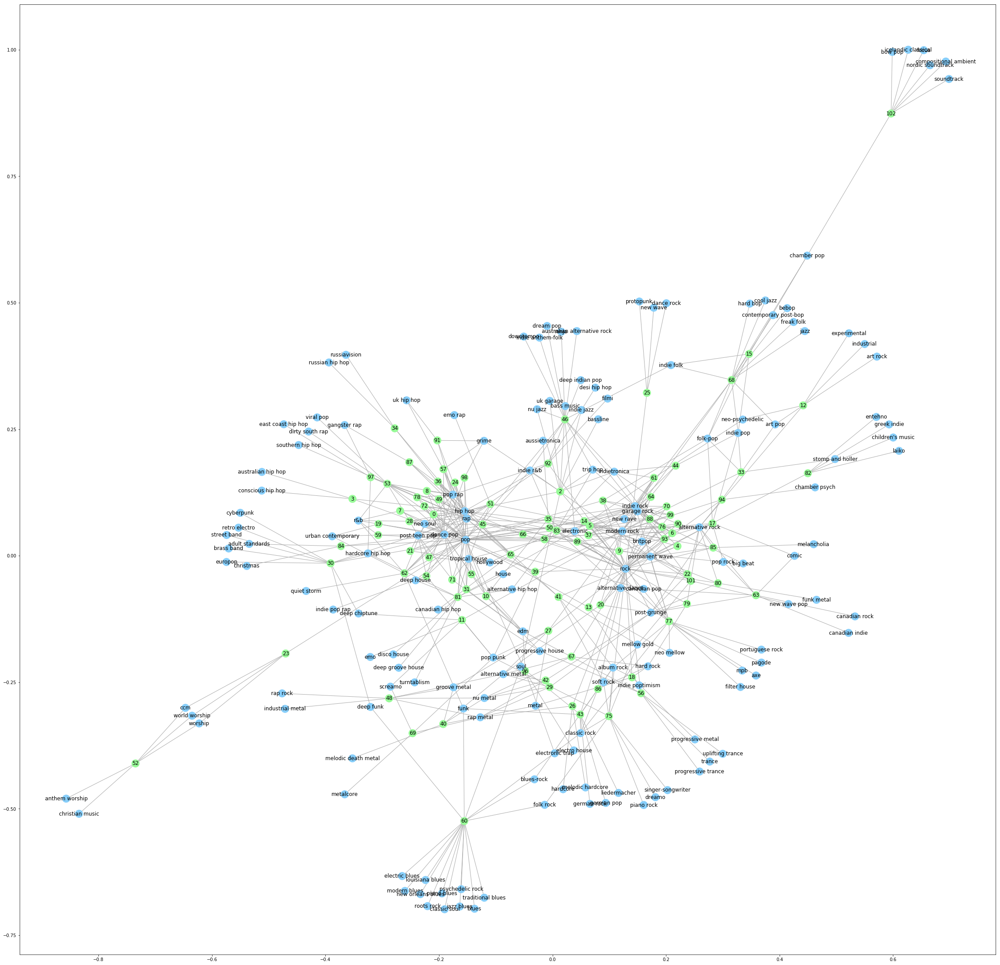

(0.0, 1.0, 0.0, 1.0)

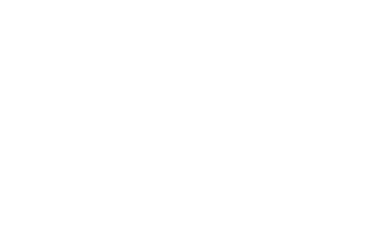

In [88]:
plt.figure(figsize=(40,40)) 
nodes = G.nodes()

# pos=nx.spring_layout(G)
nx.draw_networkx(G,pos=nx.fruchterman_reingold_layout(G),node_color=colors,edge_color='darkgray')
plt.show()

plt.axis('off')

In [89]:
list(nx.all_neighbors(G, 'pop'))

[0,
 10,
 3,
 7,
 8,
 13,
 14,
 46,
 51,
 53,
 19,
 21,
 23,
 24,
 28,
 30,
 31,
 35,
 36,
 37,
 38,
 39,
 47,
 49,
 50,
 54,
 57,
 59,
 62,
 66,
 71,
 72,
 78,
 83,
 84,
 58,
 96,
 89,
 55,
 98]

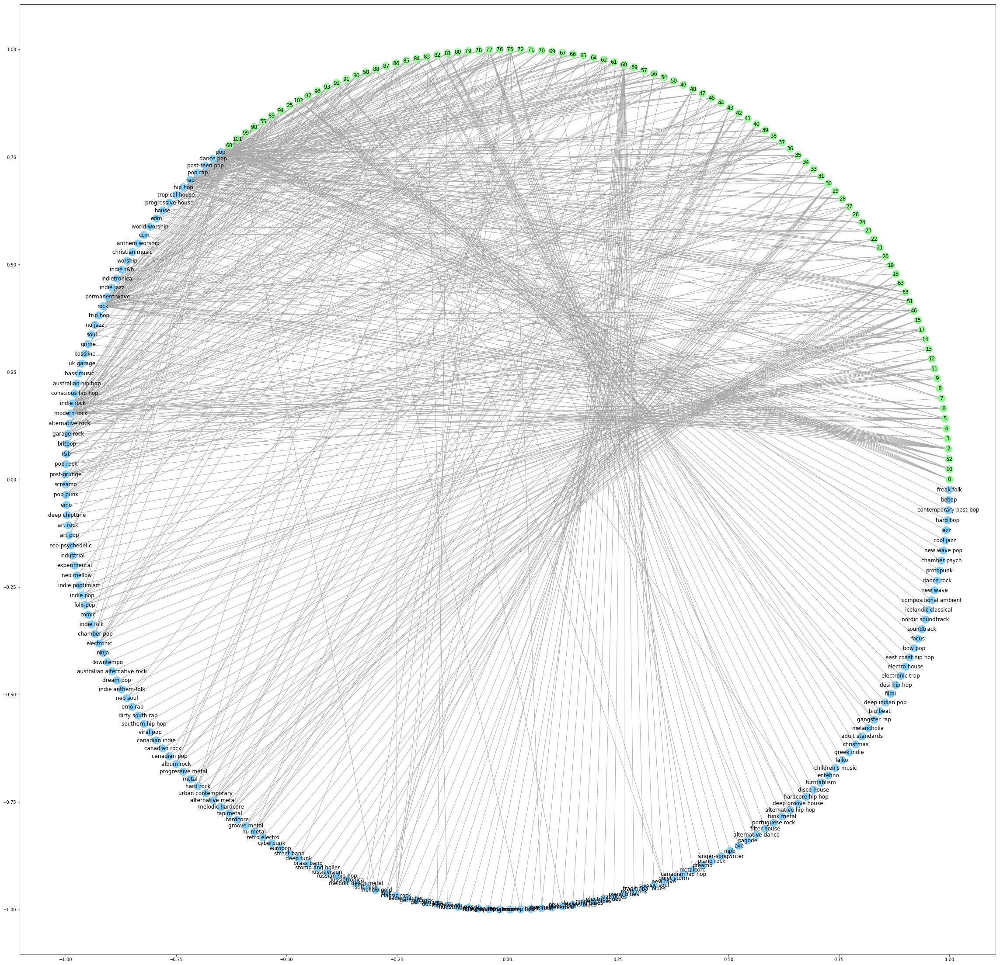

(0.0, 1.0, 0.0, 1.0)

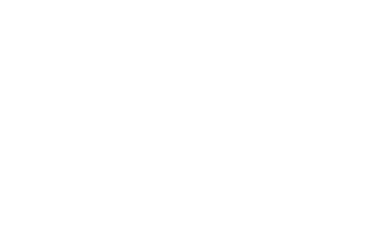

In [90]:
plt.figure(figsize=(40,40)) 
nodes = G.nodes()

nx.draw_networkx(G,pos=nx.circular_layout(G),node_color=colors,edge_color='darkgray')
plt.show()

plt.axis('off')

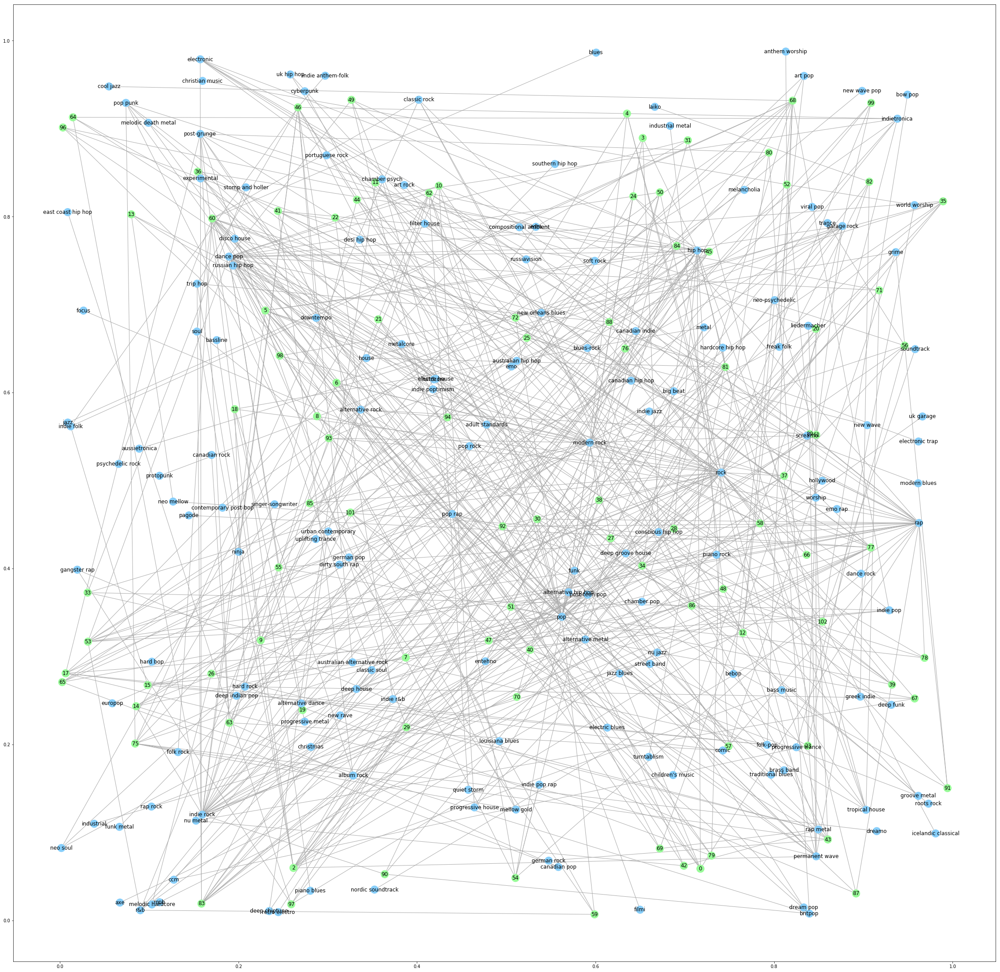

(0.0, 1.0, 0.0, 1.0)

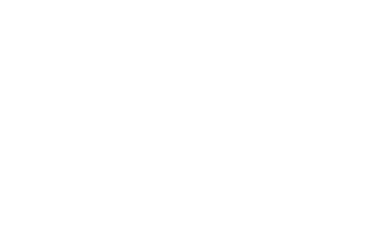

In [91]:
plt.figure(figsize=(40,40)) 
nodes = G.nodes()

nx.draw_networkx(G,pos=nx.random_layout(G),node_color=colors,edge_color='darkgray')
plt.show()

plt.axis('off')

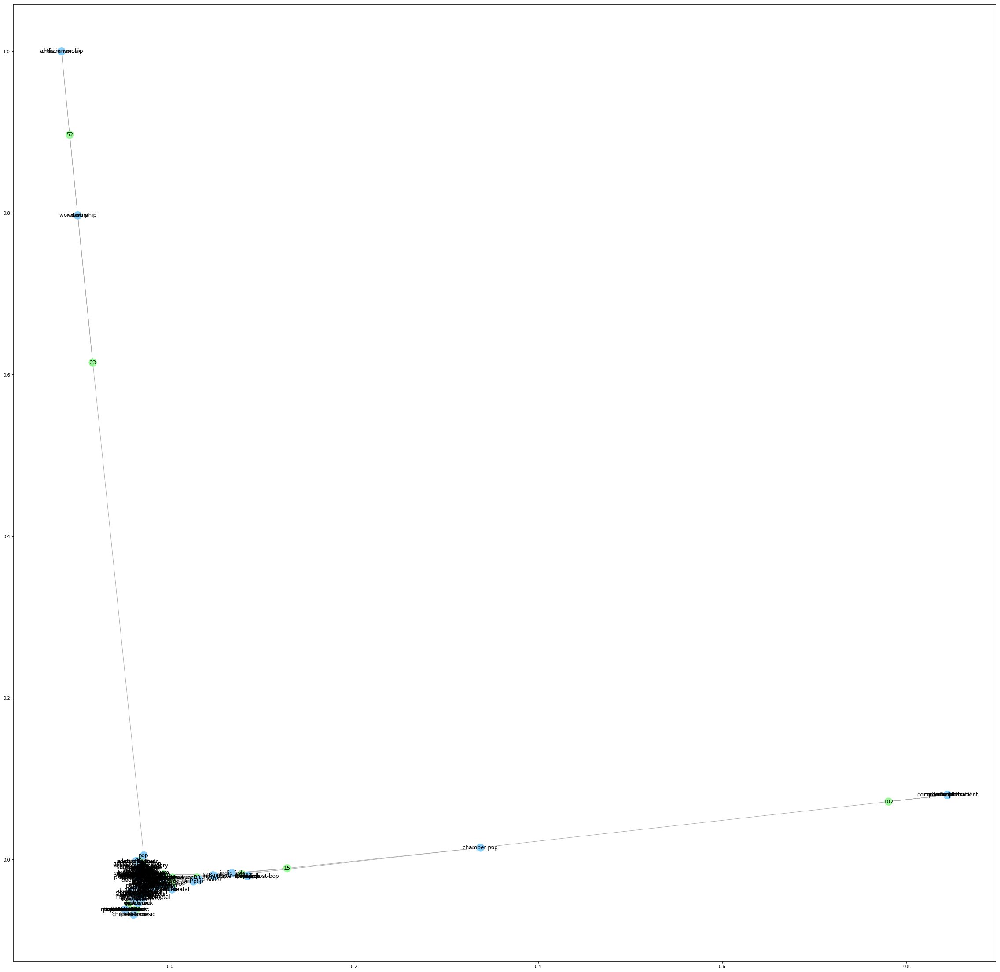

(0.0, 1.0, 0.0, 1.0)

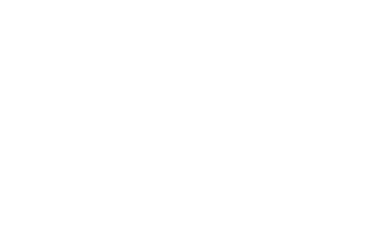

In [92]:
plt.figure(figsize=(40,40)) 
nodes = G.nodes()

nx.draw_networkx(G,pos=nx.spectral_layout(G),node_color=colors,edge_color='darkgray')
plt.show()

plt.axis('off')

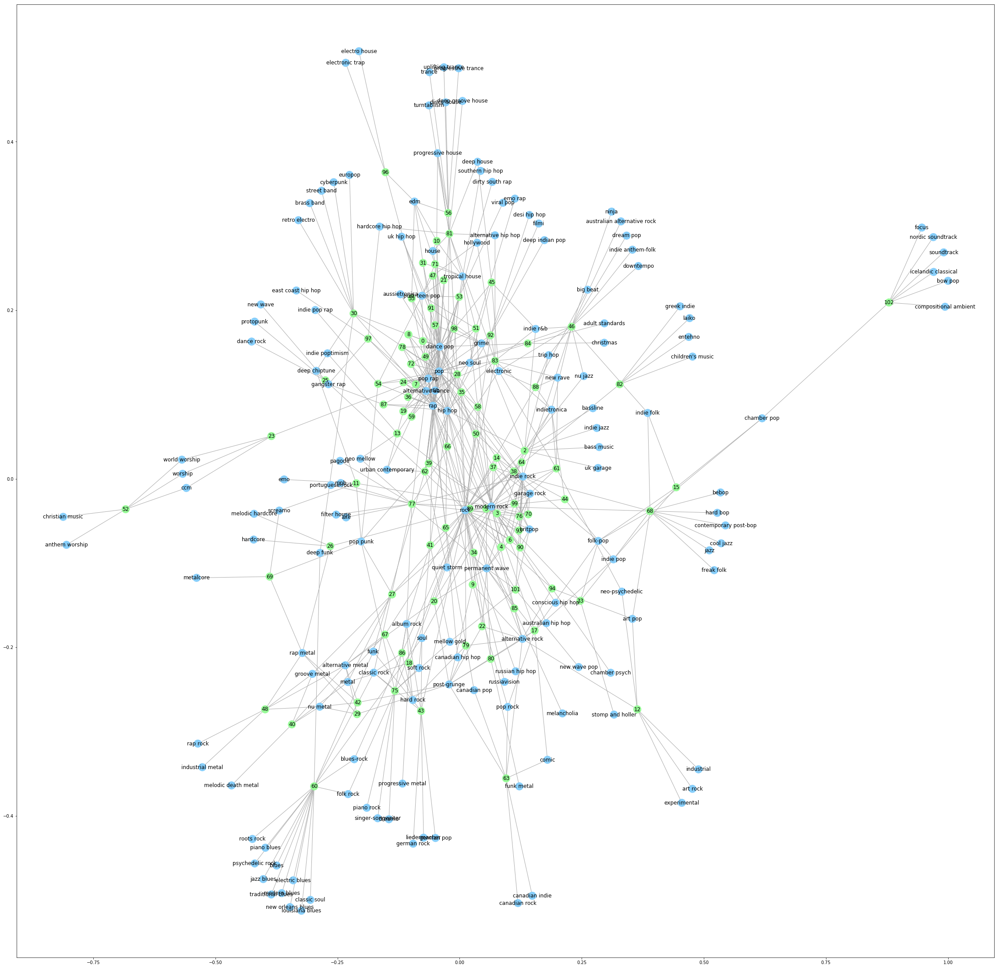

(0.0, 1.0, 0.0, 1.0)

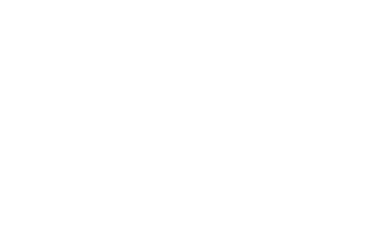

In [93]:
plt.figure(figsize=(40,40)) 
nodes = G.nodes()

nx.draw_networkx(G,pos=nx.spring_layout(G),node_color=colors,edge_color='darkgray')
plt.show()

plt.axis('off')

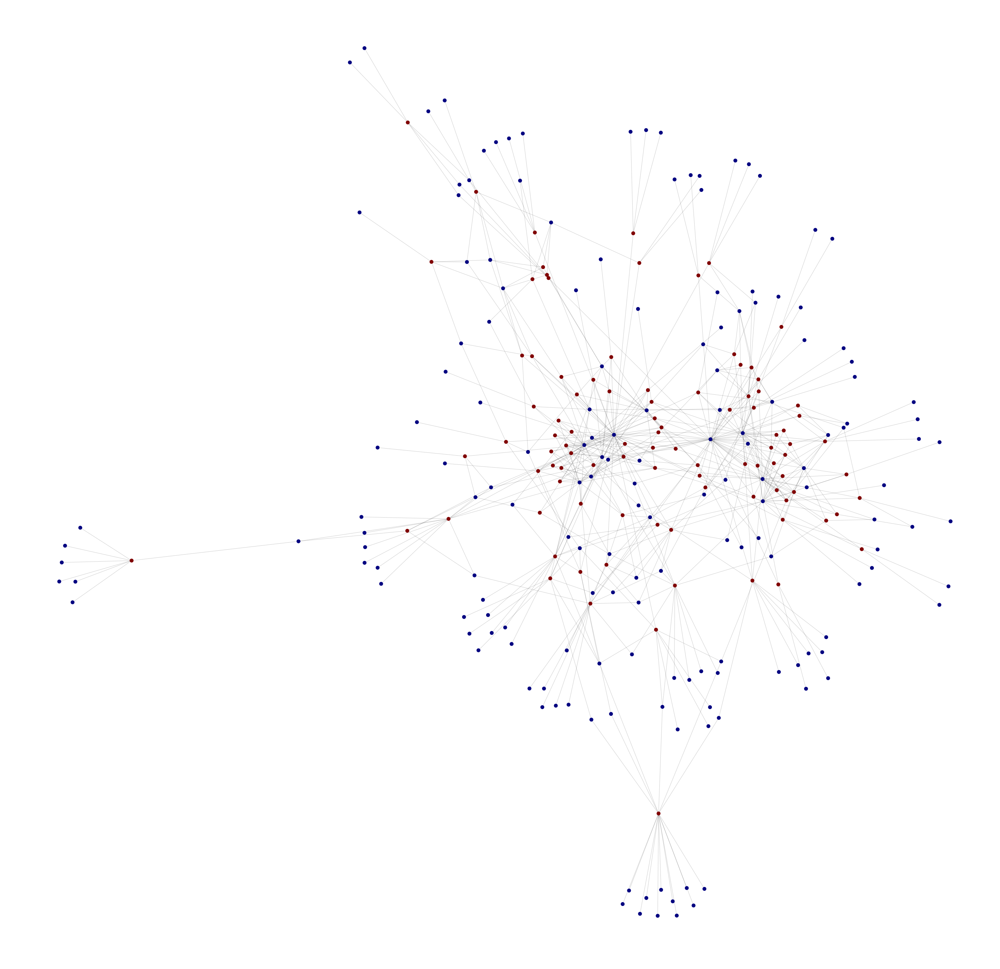

In [94]:
import matplotlib.pyplot as plt
# create number for each group to allow use of colormap
from itertools import count
# get unique groups
plt.figure(figsize=(50,50)) 

labels = {}
for node in node_names:
    labels[node] = node

groups = set(nx.get_node_attributes(G,'node_type').values())
mapping = dict(zip(sorted(groups),count()))
nodes = G.nodes()
colors = [mapping[G.node[n]['node_type']] for n in nodes]

# drawing nodes and edges separately so we can capture collection for colobar
pos = nx.spring_layout(G)
ec = nx.draw_networkx_edges(G, pos, alpha=0.2)
nc = nx.draw_networkx_nodes(G, pos, nodelist=nodes, node_color=colors, 
                            with_labels=labels, node_size=100, cmap=plt.cm.jet)
plt.axis('off')
plt.show()